<font face="Times New Roman" size=5>
<div dir=rtl align="center">
<font face="Times New Roman" size=5>
In The Name of God
</font>
<br>
<img src="https://logoyar.com/content/wp-content/uploads/2021/04/sharif-university-logo.png" alt="University Logo" width="150" height="150">
<br>
<font face="Times New Roman" size=4 align=center>
Sharif University of Technology - Department of Electrical Engineering
</font>
<br>
<font color="#008080" size=6>
Deep Generative Models
</font>

<hr/>
<font color="#800080" size=5>
Assignment 3: Generative Adversarial Networks
<br>
</font>
<font size=5>
Instructor: Dr. S. Amini
<br>
</font>
<font size=4>
Fall 2024
<br>
</font>
<font face="Times New Roman" size=4>
Deadline: Month day at 23:55
</font>
<hr>
</div></font>

In [ ]:
name = 'Alireza Farajtabrizi'
std_id = '403206554'

### In this notebook, you will implement the required components from scratch, without code completion. Utilize `torch` to create models and perform optimization. The goal of this assignment is to implement Deep Convolutional Generative Adversarial Networks (DC-GAN) using the MNIST dataset and to explore interpolation in the latent space.

### To get started, please read the DC-GAN paper available at this link: [DC-GAN Paper](https://arxiv.org/abs/1511.06434v2).


### Part 1. Load the MNIST dataset.

In [ ]:
import numpy as np
import tqdm
from matplotlib import pyplot as plt

import torch
from torch import nn
from torch import optim
from torchvision import utils, datasets, transforms
from torch.utils.data import DataLoader, ConcatDataset

np.random.seed(42)
torch.manual_seed(42)
torch.cuda.manual_seed(42)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False


device = ("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using {device} device")

Using cuda device


In [ ]:
transform = transforms.Compose([transforms.Resize((64, 64)), transforms.ToTensor()])

train_dataset = datasets.MNIST(root='./data', train=True, download=True, transform=transform)
test_dataset = datasets.MNIST(root='./data', train=False, download=True, transform=transform)

merged_dataset = ConcatDataset((train_dataset, test_dataset))
merged_loader = DataLoader(merged_dataset, batch_size=128, shuffle=False)

### Part 2: Build the Generator and Discriminator models.
Build the models with the architecture guidelines for stable training as described in the paper. It is recommended to use the model parameters presented in `config.yaml`, but you are free to choose any set of parameters you prefer.


In [ ]:
class Generator(nn.Module):
    def __init__(self, latent_dim, channels_img, features_g):
        super(Generator, self).__init__()
        self.g_net = nn.Sequential(
            self.g_block(latent_dim, features_g * 16, 4, 1, 0),
            self.g_block(features_g * 16, features_g * 8, 4, 2, 1),
            self.g_block(features_g * 8, features_g * 4, 4, 2, 1),
            self.g_block(features_g * 4, features_g * 2, 4, 2, 1),
            nn.ConvTranspose2d(features_g * 2, channels_img, kernel_size=4, stride=2, padding=1),
            nn.Tanh(),
        )

    def g_block(self, in_channels, out_channels, kernel_size, stride, padding):
        return nn.Sequential(
            nn.ConvTranspose2d(
                in_channels,
                out_channels,
                kernel_size,
                stride,
                padding,
                bias=False,
            ),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(),
        )

    def forward(self, x):
        return self.g_net(x)

class Discriminator(nn.Module):
    def __init__(self, channels_img, features_d):
        super(Discriminator, self).__init__()
        self.d_net = nn.Sequential(
            nn.Conv2d(channels_img, features_d, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.2),
            self.d_block(features_d, features_d * 2, 4, 2, 1),
            self.d_block(features_d * 2, features_d * 4, 4, 2, 1),
            self.d_block(features_d * 4, features_d * 8, 4, 2, 1),
            nn.Conv2d(features_d * 8, 1, kernel_size=4, stride=2, padding=0),
            nn.Sigmoid(),
        )

    def d_block(self, in_channels, out_channels, kernel_size, stride, padding):
        return nn.Sequential(
            nn.Conv2d(
                in_channels,
                out_channels,
                kernel_size,
                stride,
                padding,
                bias=False,
            ),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(0.2),
        )

    def forward(self, x):
        return self.d_net(x)


def initialize_weights(model):
    # Initializes weights according to the DCGAN paper
    for m in model.modules():
        if isinstance(m, (nn.Conv2d, nn.ConvTranspose2d, nn.BatchNorm2d)):
            nn.init.normal_(m.weight.data, 0.0, 0.02)


### Part 3: Write a function to train the models using the GAN framework.
You can refer to the slides or the original GAN paper for the training schema: [GAN Paper](https://arxiv.org/abs/1406.2661). Additionally, create a function to generate samples from the model. Ensure to plot a grid of generated samples every n'th epoch.


In [ ]:
channels_img = 1
latent_dim = 100
features_d = 64
features_g = 64

num_samples = 100
num_epochs = 10

learning_rate = 2e-4
beta1 = 0.5
beta2 = 0.999

Starting Training Loop...
[0/10]	Loss_D: 0.9453	Loss_G:1.5954	D(x): 0.6566	D(G(z)): 0.3383 / 0.2515


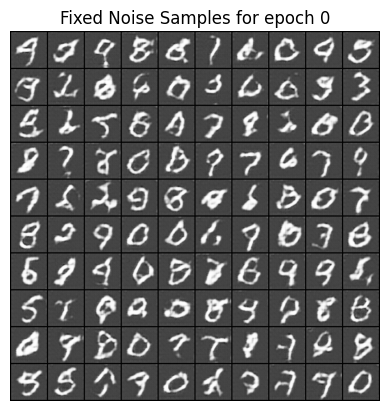

[1/10]	Loss_D: 1.1119	Loss_G:1.1739	D(x): 0.5984	D(G(z)): 0.4002 / 0.3467
[2/10]	Loss_D: 1.0860	Loss_G:1.2579	D(x): 0.6098	D(G(z)): 0.3903 / 0.3259


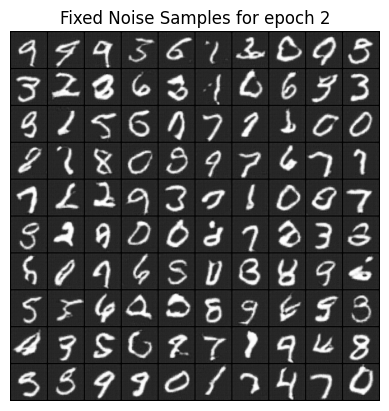

[3/10]	Loss_D: 1.0299	Loss_G:1.4380	D(x): 0.6325	D(G(z)): 0.3675 / 0.2899
[4/10]	Loss_D: 0.9021	Loss_G:1.7551	D(x): 0.6776	D(G(z)): 0.3225 / 0.2384


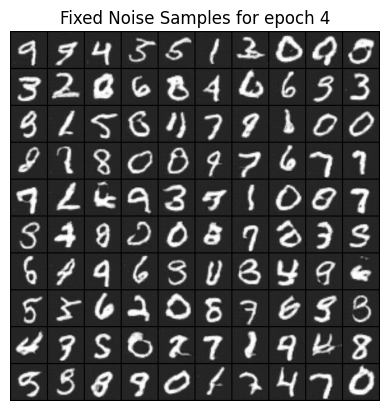

[5/10]	Loss_D: 0.7790	Loss_G:2.1164	D(x): 0.7240	D(G(z)): 0.2755 / 0.1933
[6/10]	Loss_D: 0.6665	Loss_G:2.3993	D(x): 0.7615	D(G(z)): 0.2385 / 0.1647


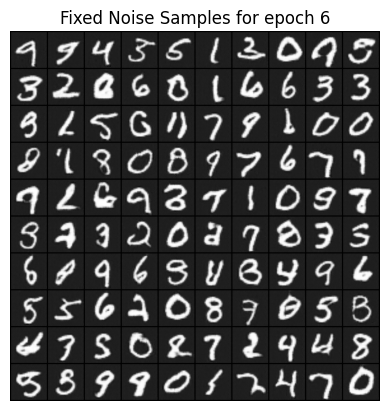

[7/10]	Loss_D: 0.5815	Loss_G:2.7421	D(x): 0.7976	D(G(z)): 0.2023 / 0.1358
[8/10]	Loss_D: 0.5002	Loss_G:3.0534	D(x): 0.8268	D(G(z)): 0.1727 / 0.1147


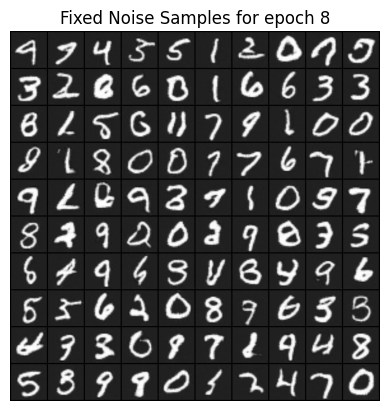

[9/10]	Loss_D: 0.5304	Loss_G:2.9871	D(x): 0.8287	D(G(z)): 0.1715 / 0.1198


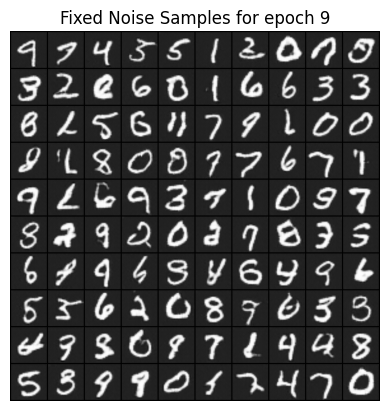

In [22]:
gen_model = Generator(latent_dim, channels_img, features_g).to(device)
gen_model.apply(initialize_weights)

disc_model = Discriminator(channels_img ,features_d).to(device)
disc_model.apply(initialize_weights)

criterion = nn.BCELoss()
optimizerD = optim.Adam(disc_model.parameters(), lr=learning_rate, betas=(beta1, beta2))
optimizerG = optim.Adam(gen_model.parameters(), lr=learning_rate, betas=(beta1, beta2))

fixed_noise = torch.randn(num_samples, latent_dim, 1, 1, device=device)

img_list = []
G_losses = []
D_losses = []

fake = gen_model(fixed_noise).detach().cpu()
grid = utils.make_grid(fake, nrow=10, padding=2, normalize=True)
img_list.append(grid)

print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    epoch_loss_disc = 0
    epoch_loss_gen = 0
    D_x = 0
    D_G_z1 = 0
    D_G_z2 = 0

    for i, data in enumerate(merged_loader):

        #############################################################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        #############################################################
        disc_model.zero_grad()
        real_img = data[0].to(device)
        batch_size = real_img.size(0)

        # discreminator for real samples
        output_real = disc_model(real_img).view(-1)
        D_x += output_real.mean().item()
        loss_disc_real = criterion(output_real, torch.ones_like(output_real))

        # discreminator for fake samples
        noise = torch.randn(batch_size, latent_dim, 1, 1, device=device)
        fake = gen_model(noise)

        output_fake = disc_model(fake.detach()).view(-1)
        loss_disc_fake = criterion(output_fake, torch.zeros_like(output_fake))
        loss_disc = loss_disc_real + loss_disc_fake

        # D(z) for fake noise before Discreminator update
        D_G_z1 += output_fake.mean().item()
        loss_disc.backward()
        optimizerD.step()

        epoch_loss_disc += loss_disc.item()
        #############################################
        # (2) Update G network: maximize log(D(G(z)))
        #############################################
        gen_model.zero_grad()
        output_fake = disc_model(fake).view(-1)
        loss_gen = criterion(output_fake, torch.ones_like(output_fake))

        # D(z) for fake noise after Discreminator update
        D_G_z2 += output_fake.mean().item()
        loss_gen.backward()
        optimizerG.step()
        epoch_loss_gen += loss_gen.item()

    #############################################################################################
    # end of batch process
    epoch_loss_disc = epoch_loss_disc / len(merged_loader)
    epoch_loss_gen = epoch_loss_gen / len(merged_loader)
    D_x = D_x / len(merged_loader)
    D_G_z1 = D_G_z1 / len(merged_loader)
    D_G_z2 = D_G_z2 / len(merged_loader)

    G_losses.append(epoch_loss_gen)
    D_losses.append(epoch_loss_disc)
    print(f'[{epoch}/{num_epochs}]\tLoss_D: {epoch_loss_disc:.4f}\tLoss_G:{epoch_loss_gen:.4f}\tD(x): {D_x:.4f}\tD(G(z)): {D_G_z1:.4f} / {D_G_z2:.4f}')

    with torch.no_grad():
      fake = gen_model(fixed_noise).detach().cpu()
      grid = utils.make_grid(fake, nrow=10, padding=2, normalize=True)
      img_list.append(grid)

    if (epoch % 2 == 0) or ((epoch == num_epochs-1)):
        plt.imshow(np.transpose(img_list[-1],(1,2,0)), )
        plt.title(f"Fixed Noise Samples for epoch {epoch}")
        plt.axis("off")
        plt.show()
    # end of epoch
    #############################################################################################
torch.save(disc_model.state_dict(), 'Discriminator_model.pth')
torch.save(gen_model.state_dict(), 'Generator_model.pth')


In [50]:
gen_model = Generator(latent_dim, channels_img, features_g).to(device)
gen_model.load_state_dict(torch.load("Generator_model.pth", weights_only=True))

disc_model = Discriminator(channels_img ,features_d).to(device)
disc_model.load_state_dict(torch.load("Discriminator_model.pth", weights_only=True))

<All keys matched successfully>

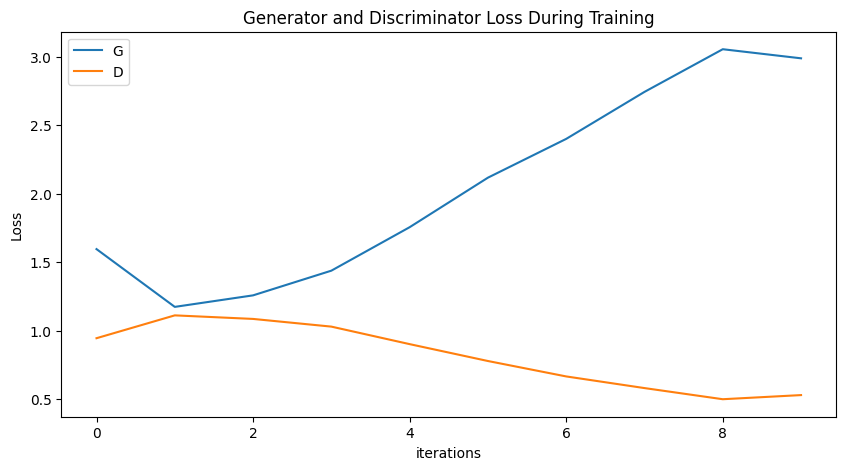

In [24]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

### Part 4: Plot a grid of 100 generated samples.

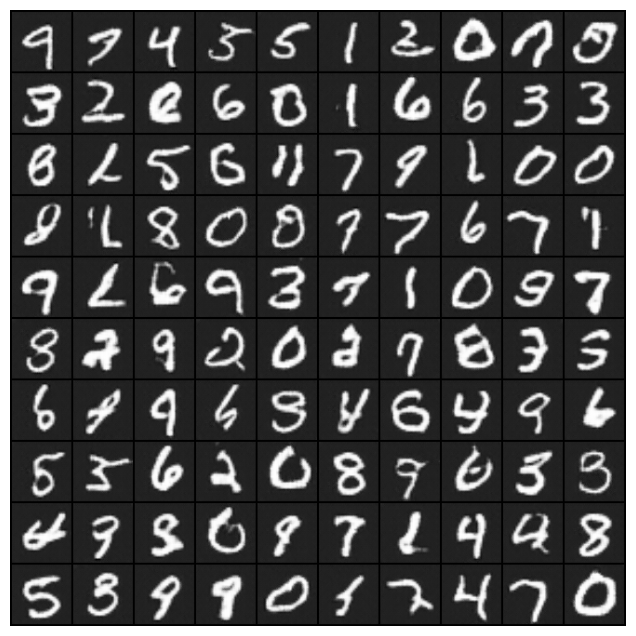

In [51]:
import matplotlib.animation as animation
from IPython.display import HTML

fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

### Part 5: GAN Inversion
In this part, we aim to find the latent vectors corresponding to the samples in the dataset. First, select a random sample from the real dataset and a random latent vector. Freeze the generator and feed the random latent vector into the Generator. Next, define an MSE or MAE loss between the generated sample and the real sample, and optimize the random latent vector to discover the latent vector that generates the selected real sample.


In [52]:
def gan_inveret(gen_model, image, iterations):
    gen_model.eval()
    gen_model = gen_model.to(device)

    image = image.to(device)
    z_random = torch.zeros(1, 100, 1, 1, requires_grad=True, device=device)

    criterion = nn.MSELoss()
    optimizer = optim.Adam([z_random], lr=1)

    for epoch in range(iterations):
        generated_sample = gen_model(z_random)
        loss = criterion(generated_sample.squeeze(), image.squeeze())

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    return z_random.squeeze()

### Part 6: Interpolating the Latent Space
In this part, you will interpolate the latent space using a 10 by 10 grid. Start with 4 initial points representing the corners of the square, and then perform linear or spherical interpolation between the latent vectors of these 4 images to fill the circumference of the square.
Next, fill in the rest of the square by interpolating between the latent vectors along the circumference.

If $G$ is the generator, and $z_1$ and $z_2$ are two latent vectors of two images, let $w$ be a parameter that varies between $0$ and $1$. The linearly interpolated sample is generated as:

\begin{equation}
G(w \cdot z_1 + (1 - w) \cdot z_2)\
\end{equation}

Try to select the 4 starting images from those that exhibit distinct features. For example, the two top right corners could be the same digit but one with a thick stroke and the other with a thin stroke, while the other two points should be from a different digit but with varying stroke styles.

In [53]:
def plot_corners(images):
    plt.figure(figsize = (3,3))
    plt.subplot(2,2,1)
    plt.imshow(images[0].squeeze(), cmap="gray")
    plt.axis("off")
    plt.subplot(2,2,2)
    plt.imshow(images[1].squeeze(), cmap="gray")
    plt.axis("off")
    plt.subplot(2,2,3)
    plt.imshow(images[2].squeeze(), cmap="gray")
    plt.axis("off")
    plt.subplot(2,2,4)
    plt.imshow(images[3].squeeze(), cmap="gray")
    plt.axis("off")
    plt.show()

def interpolate_z(model, images, latent_dim, iterations):
    z = torch.zeros(10, 10, latent_dim, device=device)
    z[0, 0] = gan_inveret(model, images[0], iterations)
    z[0, 9] = gan_inveret(model, images[1], iterations)
    z[9, 0] = gan_inveret(model, images[2], iterations)
    z[9, 9] = gan_inveret(model, images[3], iterations)

    for i in range(10):
        if i == 0 or i ==9:
            pass
        else:
            z[i,0] = (1-i/9)*z[0,0] + (i/9)*z[9,0]
            z[i,9] = (1-i/9)*z[0,9] + (i/9)*z[9,9]
        for j in range(1,9):
            z[i,j] = (1-j/9)*z[i,0] + (j/9)*z[i,9]
    return z

In [54]:
def interpolate_function(model, images, latent_dim, iterations):
    plot_corners(images)
    z = interpolate_z(model, images, latent_dim, iterations)
    z = z.reshape(100, 100, 1, 1)
    fake = model(z).detach().cpu()
    img_grid_fake = utils.make_grid(fake, nrow=10)
    plt.figure(figsize=(10,10))
    plt.title("Interpolatd Samples")
    plt.axis("off")
    plt.imshow(img_grid_fake.permute(1, 2, 0).squeeze())
    plt.show()

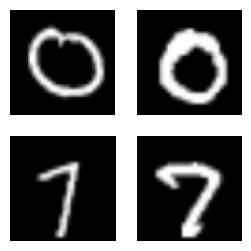

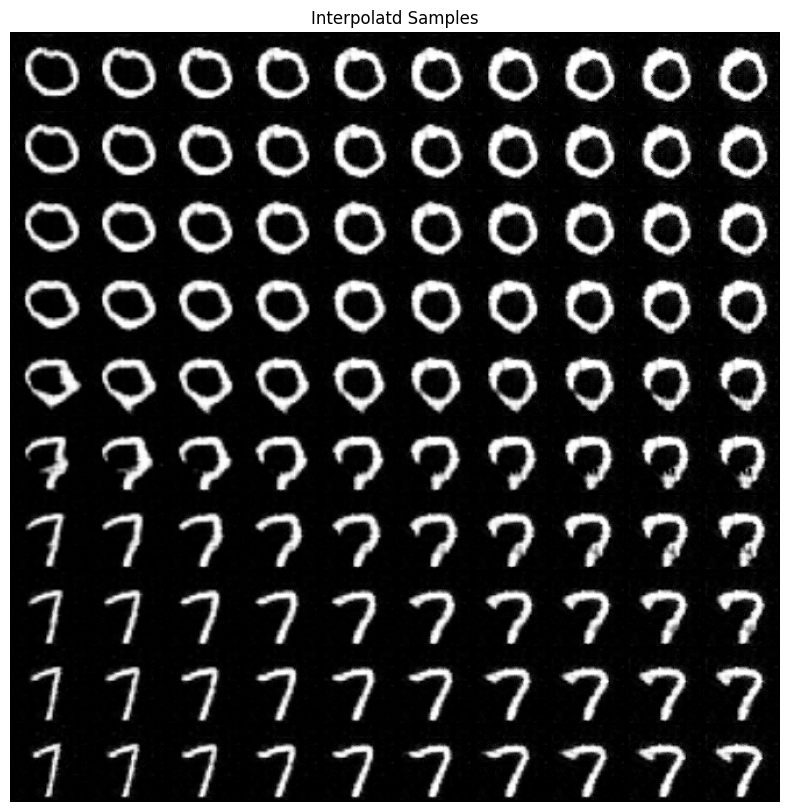

In [55]:
images =  [merged_dataset[108][0], merged_dataset[56][0], merged_dataset[42][0], merged_dataset[52][0]]
interpolate_function(gen_model,images, latent_dim, 100)

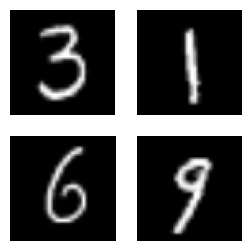

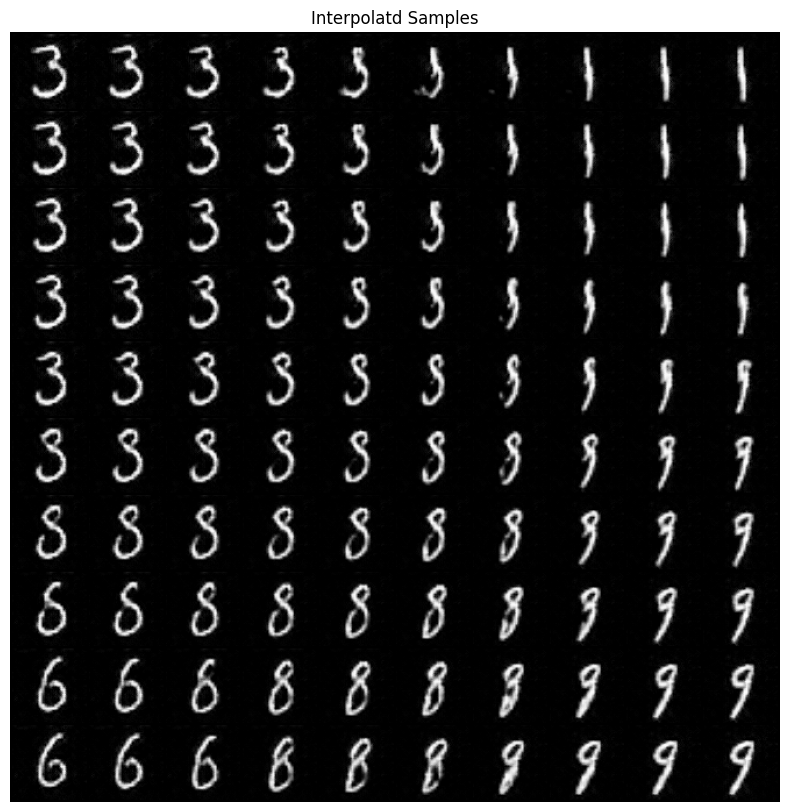

In [56]:
images =  [merged_dataset[50][0], merged_dataset[8][0],merged_dataset[18][0], merged_dataset[43][0]]
interpolate_function(gen_model,images, latent_dim, 100)

### Part 7: Arithmetic Operation in Latent Space
In this part, you will attempt to modify the thickness or thinness of a sample by identifying the direction in the latent space that corresponds to these attributes. Additionally, you can explore changing a digit to another (e.g., transforming a digit into a 3) by finding the direction in the latent space that corresponds to that digit.


یه توضیح کلی بدم این بخش چی کار کردم: اول اومدم دیتاست رو برحسب رفم ها جدا کردم بعد فرض کردم جمع پیکسل های هر عکس نشون میده چه قدر ضخیم یا نازکه. پس جمع پیکسل های همه داده های هر رقم رو میانگین گرفتم. بعد یه ترشهولد گذاشتم که اگه چه نسبتی با این میانگین داشته باشه ضخیمه یا نازک و بعد خروجی این منطق رو پلات کردم که نشون میداد فرضم درسته و جمع پیکسل ها برای هر رقم نسبت به میانگینش معناداره. بعدش اومدم برای سمپل های نازک و ضخیم لیتنت رو حساب کردم و میانگین لیتنت های ضخیم رو از میانگین لیتنت های نازک کم کردم و بررسی کردم آیا این جهت به ازای هر رقم و به صورت کلی معنادار هست یا نه و کار میکنه یا نه؟

In [57]:
# group samples by their digit
def group_samples_by_digit(dataloader):
    grouped_samples = [[] for _ in range(10)]

    for images, labels in dataloader:
        for image, label in zip(images, labels):
            grouped_samples[label.item()].append(image)

    return grouped_samples

# get average sum of pixels per digit
def get_digit_sum(digit_list):
    digit_sum = [0 for i in range(10)]
    for i in range(10):
        for digit_sample in digit_list[i]:
            digit_sum[i]+=torch.sum(digit_sample).item()
        digit_sum[i]/=len(digit_list[i])

    return digit_sum

# threshold > 1 for getting thich digits and <1 for thin digits
def get_samples(dataloader, average_sums, threshold):
    samples_above_average = [[] for _ in range(10)]
    for images, labels in dataloader:
        for image, label in zip(images, labels):
            pixel_sum = image.sum().item()

            if threshold >1:
                if pixel_sum > average_sums[label.item()] * threshold:
                    samples_above_average[label.item()].append(image)
            else:
                if pixel_sum < average_sums[label.item()] * threshold:
                    samples_above_average[label.item()].append(image)

    return samples_above_average

# to obsereve how good average sum is correlated with thickness
def plot_samples(input_samples, threshold):
    for digit in range(10):
        samples = input_samples[digit]
        if len(samples) >= 5:
            fig, axes = plt.subplots(1, 5, figsize=(15, 3))

            for i in range(5):
                axes[i].imshow(samples[i].squeeze(), cmap='gray')
                axes[i].axis('off')
            plt.suptitle(f"Digit {digit} - Samples with Sum {threshold}times the Average", fontsize=16)
            plt.show()

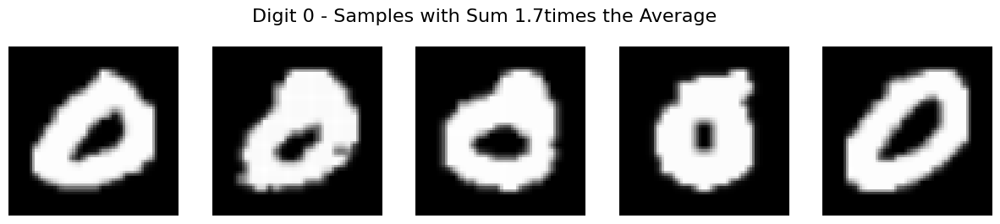

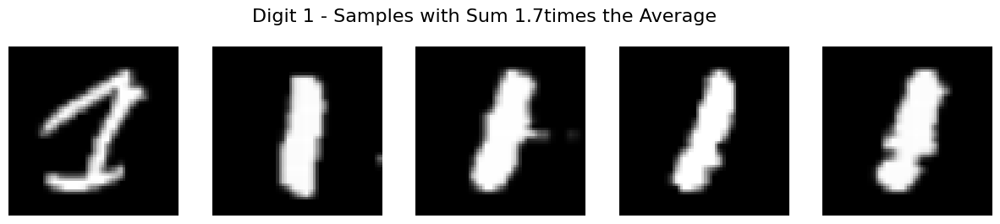

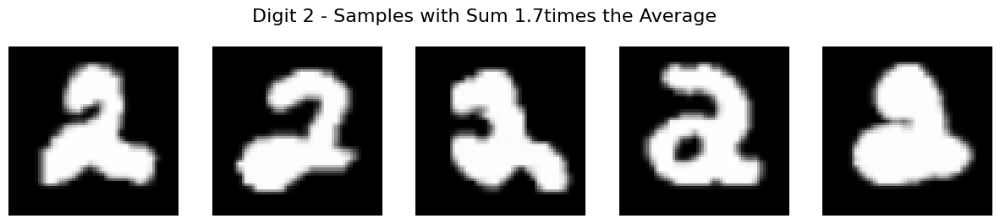

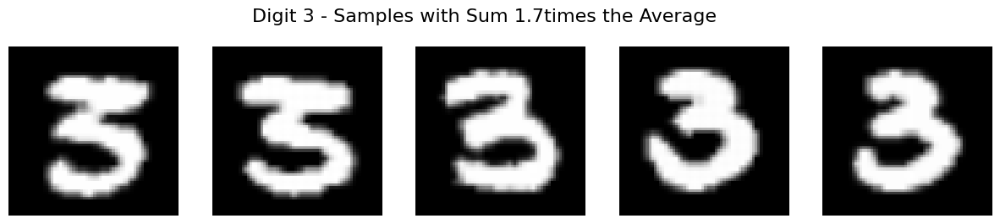

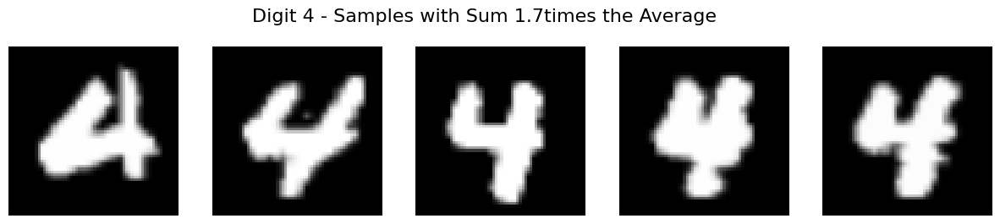

...

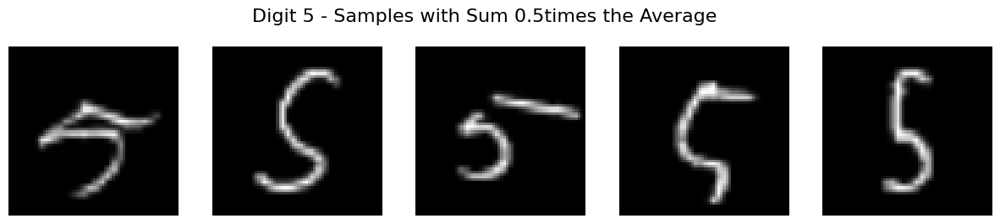

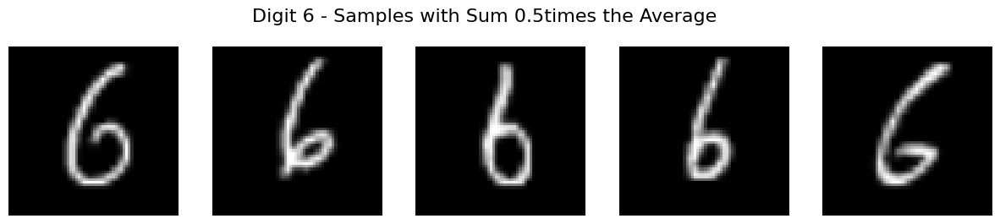

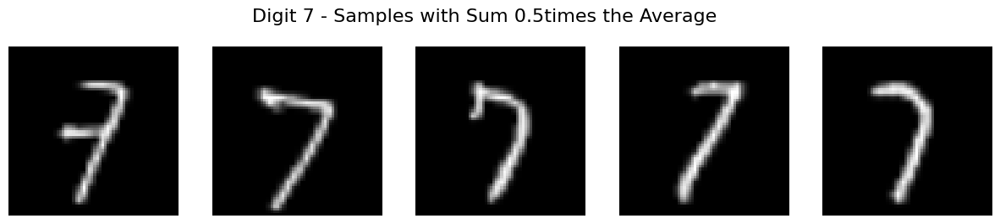

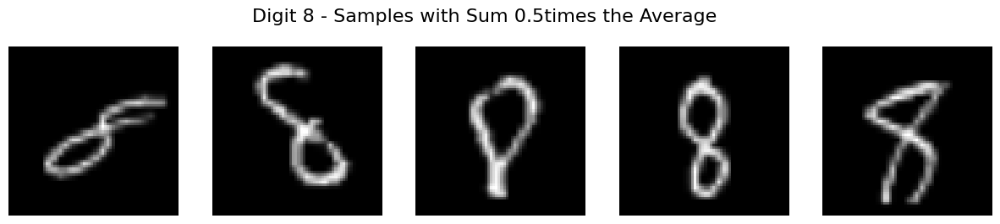

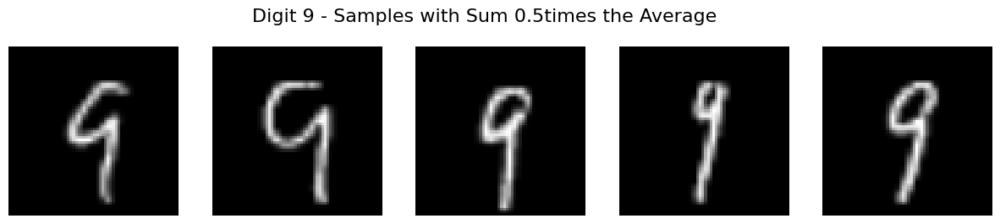

In [58]:
digit_list = group_samples_by_digit(merged_loader)
digit_sum = get_digit_sum(digit_list)
thick_samples = get_samples(merged_loader, digit_sum, 1.7)
plot_samples(thick_samples, 1.7)
thin_samples = get_samples(merged_loader, digit_sum, 0.5)
plot_samples(thin_samples, 0.5)

In [59]:
thin_samples_z = [torch.zeros(latent_dim, device=device) for _ in range(10)]
for i in range(10):
    for sample in tqdm.tqdm(thin_samples[i]):
        thin_samples_z[i] += gan_inveret(gen_model,sample,100)
    thin_samples_z[i]/=len(thin_samples[i])

thick_samples_z = [torch.zeros(latent_dim, device=device) for _ in range(10)]
for i in range(10):
    for sample in tqdm.tqdm(thick_samples[i]):
        thick_samples_z[i] += gan_inveret(gen_model,sample,100)
    thick_samples_z[i]/=len(thick_samples[i])

direction = torch.zeros(latent_dim, device=device)
for i in range(10):
    direction += thick_samples_z[i] - thin_samples_z[i]
direction/=10

100%|██████████| 103/103 [00:47<00:00,  2.17it/s]


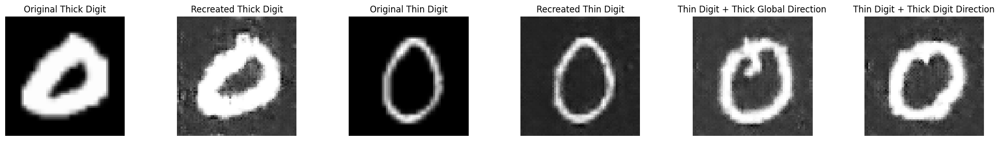

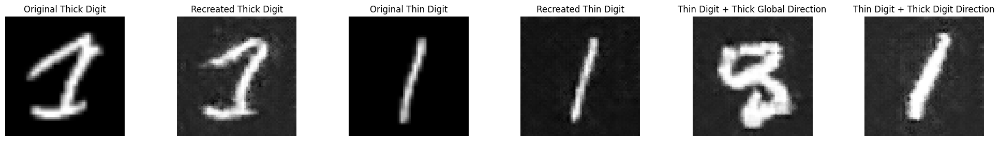

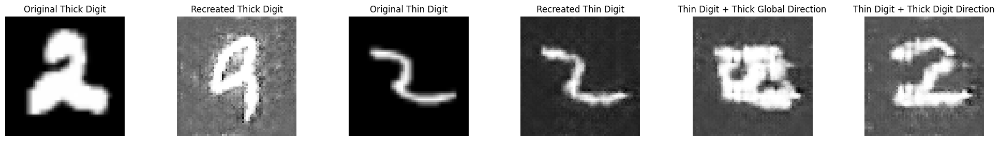

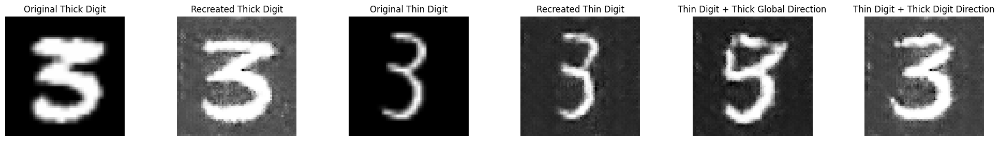

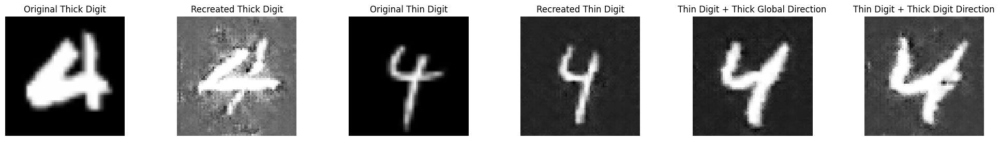

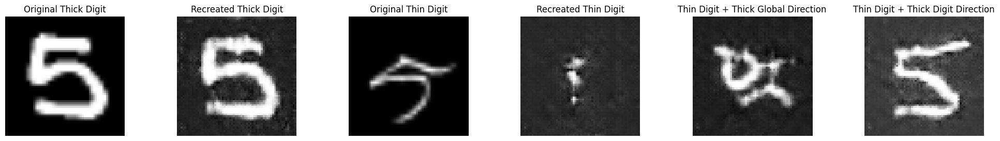

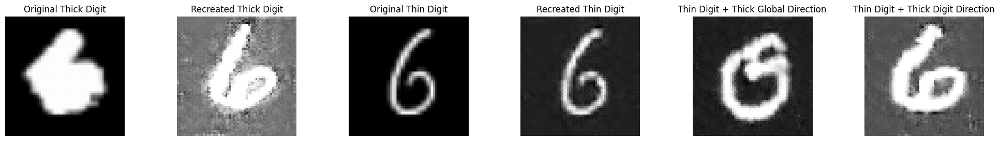

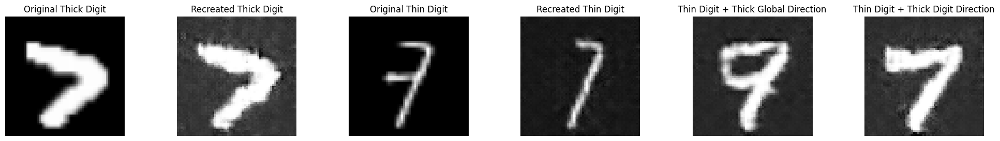

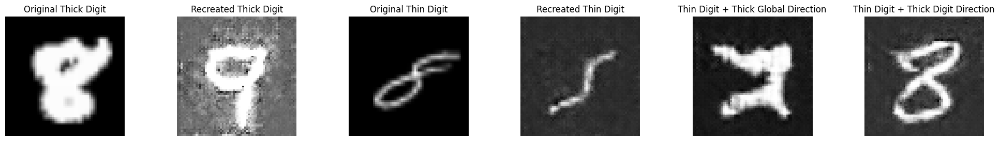

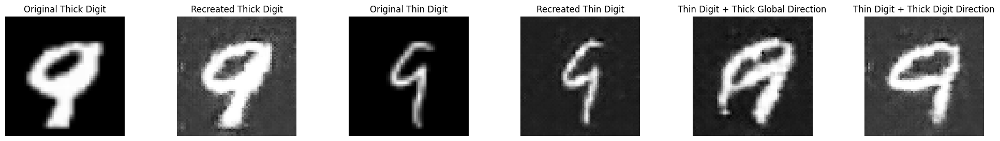

In [60]:
# k'th sample
k = 0
for i in range(10):
    plt.figure(figsize=(25, 3))
    plt.subplot(1, 6, 1)
    plt.imshow(thick_samples[i][k].squeeze(), cmap='gray')
    plt.title('Original Thick Digit')
    plt.axis('off')
    plt.subplot(1, 6, 2)
    z = gan_inveret(gen_model, thick_samples[i][k],100).reshape(1,-1,1,1)
    plt.imshow(gen_model(z).squeeze().detach().cpu().numpy(), cmap='gray')
    plt.title('Recreated Thick Digit')
    plt.axis('off')
    plt.subplot(1, 6, 3)
    plt.imshow(thin_samples[i][k].squeeze(), cmap='gray')
    plt.title('Original Thin Digit')
    plt.axis('off')
    plt.subplot(1, 6, 4)
    z = gan_inveret(gen_model, thin_samples[i][k],100).reshape(1,-1,1,1)
    plt.imshow(gen_model(z).squeeze().detach().cpu().numpy(), cmap='gray')
    plt.title('Recreated Thin Digit')
    plt.axis('off')

    plt.subplot(1, 6, 5)
    z = (gan_inveret(gen_model, thin_samples[i][k],100)+direction).reshape(1,-1,1,1)
    plt.imshow(gen_model(z).squeeze().detach().cpu().numpy(), cmap='gray')
    plt.title('Thin Digit + Thick Global Direction')
    plt.axis('off')

    plt.subplot(1, 6, 6)
    z = (gan_inveret(gen_model, thin_samples[i][k],100)+(thick_samples_z[i] - thin_samples_z[i])).reshape(1,-1,1,1)
    plt.imshow(gen_model(z).squeeze().detach().cpu().numpy(), cmap='gray')
    plt.title('Thin Digit + Thick Digit Direction')
    plt.axis('off')

    plt.show()

همونطور که از عکس بالا معلومه اولا فانکشن معکوس گن که لیتنت رو از عکس میسازه داره خوب کار میکنه. ولی اون جهت ضخیم شدن گلوبال یه جاهایی بد عمل کرده ولی جهت ضخیم شدن به ازای هر رقم درست کار کرده. اما یه جاهایی که لیتنت محاسبه شده اشتباه بوده بعد اعمال این جهت مخصوص هر رقم  خروجی درست شده که نشون میده جهت هر رقم به جز ضخامت اطلاعات اون رقم رو هم داره

In [61]:
z_3 = (thin_samples_z[3]+thick_samples_z[3])/2
z_global = 0
for i in range(10):
    if i!=3:
        z_global+= (thin_samples_z[i]+thick_samples_z[i])/2
z_global/=9
z_3 = z_3 - z_global

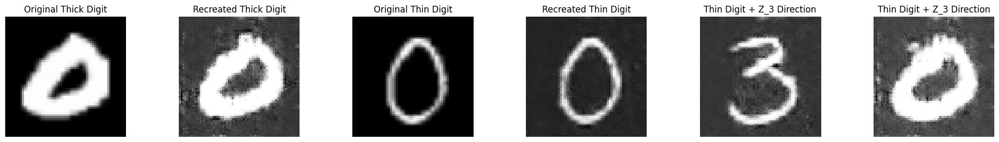

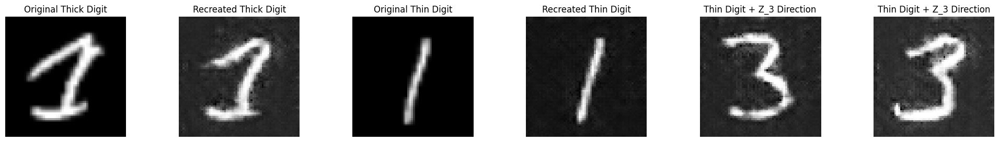

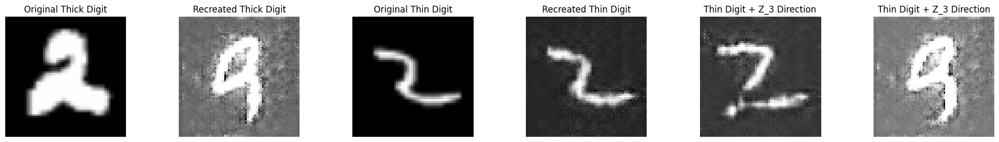

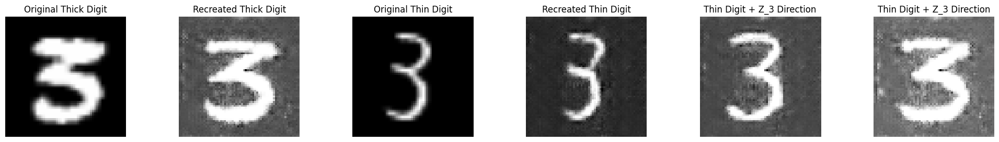

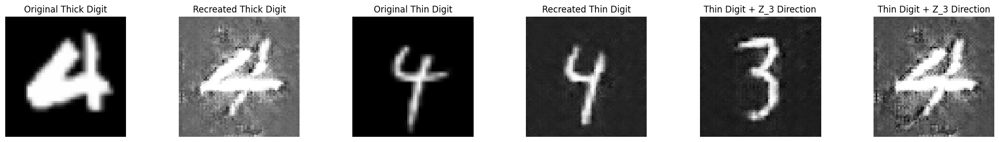

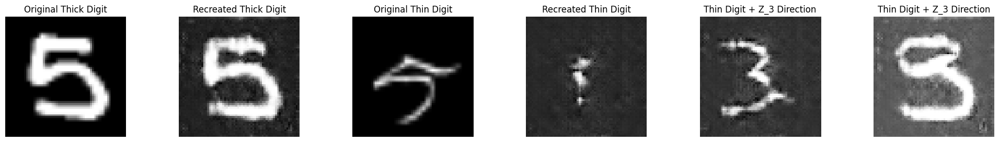

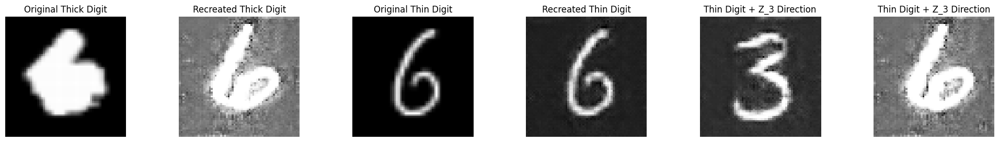

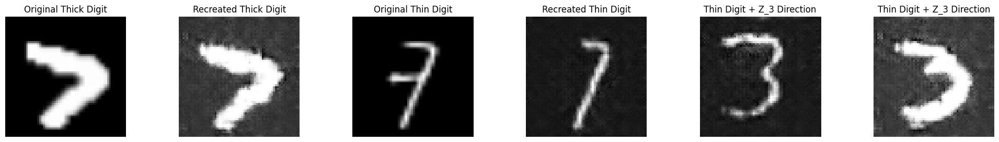

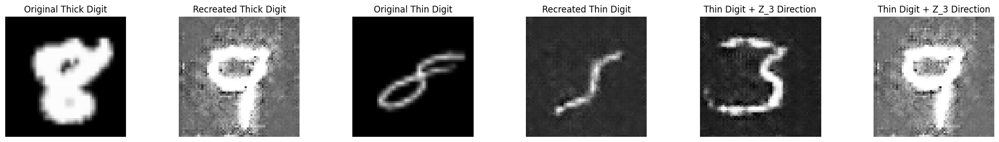

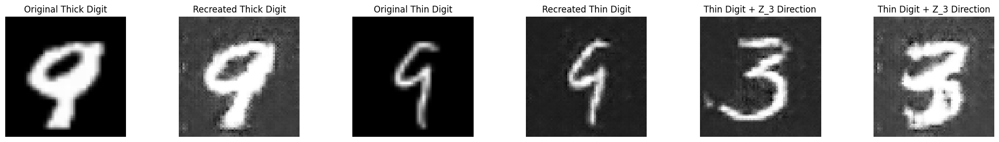

In [67]:
# k'th sample
k = 0
for i in range(10):
    plt.figure(figsize=(25, 3))
    plt.subplot(1, 6, 1)
    plt.imshow(thick_samples[i][k].squeeze(), cmap='gray')
    plt.title('Original Thick Digit')
    plt.axis('off')
    plt.subplot(1, 6, 2)
    z = gan_inveret(gen_model, thick_samples[i][k],100).reshape(1,-1,1,1)
    plt.imshow(gen_model(z).squeeze().detach().cpu().numpy(), cmap='gray')
    plt.title('Recreated Thick Digit')
    plt.axis('off')
    plt.subplot(1, 6, 3)
    plt.imshow(thin_samples[i][k].squeeze(), cmap='gray')
    plt.title('Original Thin Digit')
    plt.axis('off')
    plt.subplot(1, 6, 4)
    z = gan_inveret(gen_model, thin_samples[i][k],100).reshape(1,-1,1,1)
    plt.imshow(gen_model(z).squeeze().detach().cpu().numpy(), cmap='gray')
    plt.title('Recreated Thin Digit')
    plt.axis('off')

    plt.subplot(1, 6, 5)
    z = (gan_inveret(gen_model, thin_samples[i][k],100)+z_3).reshape(1,-1,1,1)
    plt.imshow(gen_model(z).squeeze().detach().cpu().numpy(), cmap='gray')
    plt.title('Thin Digit + Z_3 Direction')
    plt.axis('off')

    plt.subplot(1, 6, 6)
    z = (gan_inveret(gen_model, thick_samples[i][k],100)+z_3).reshape(1,-1,1,1)
    plt.imshow(gen_model(z).squeeze().detach().cpu().numpy(), cmap='gray')
    plt.title('Thin Digit + Z_3 Direction')
    plt.axis('off')
    plt.show()

تقریبا تمام اعداد نازک به 3 تبدیل شدند ولی بعضی اعداد ضخیم به 3 تبدیل نشدند